

# **Color Spaces**

In this lesson we'll learn to:
1. View the individual channels of an RGB Image
2. Manipulate a color space
3. Introduce HSV Color Spaces

In [1]:
# Our Setup, Import Libaries, Create our Imshow Function and Download our Images
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define our imshow function
def imshow(title = "Image", image = None, size = 10):
    h, w = image.shape[0], image.shape[1]
    aspect_ratio = h/w
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

# Download and unzip our images
!wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
!unzip -qq images.zip

--2024-03-25 23:53:45--  https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
Resolving moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)... 52.95.144.30, 52.95.150.154, 52.95.142.50, ...
Connecting to moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)|52.95.144.30|:443... connected.
HTTP request sent, awaiting response... 403 Forbidden
2024-03-25 23:53:45 ERROR 403: Forbidden.

unzip:  cannot find or open images.zip, images.zip.zip or images.zip.ZIP.


In [2]:
# Load our input image
image = cv2.imread('/content/lena.png')

# Use cv2.split to get each color space separately
B, G, R = cv2.split(image)
print(B.shape)
print(G.shape)
print(R.shape)

(440, 440)
(440, 440)
(440, 440)


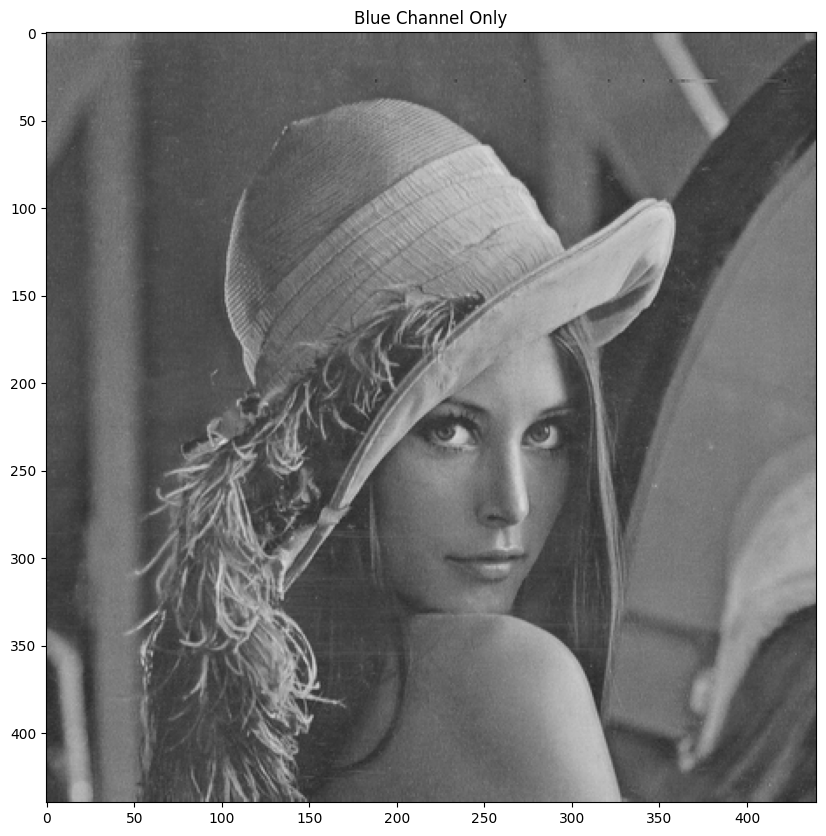

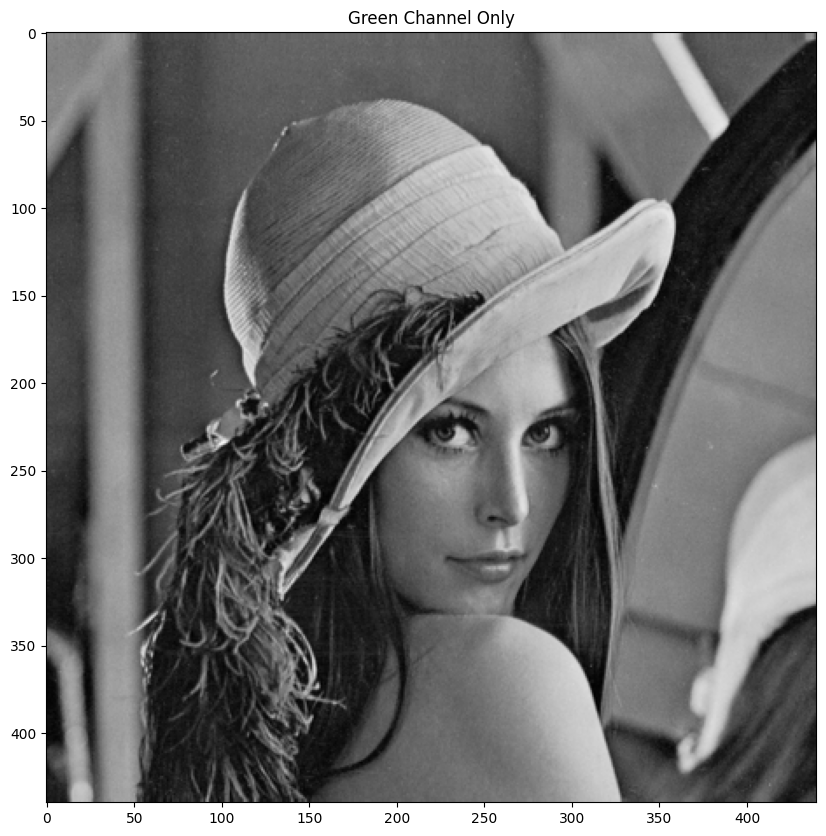

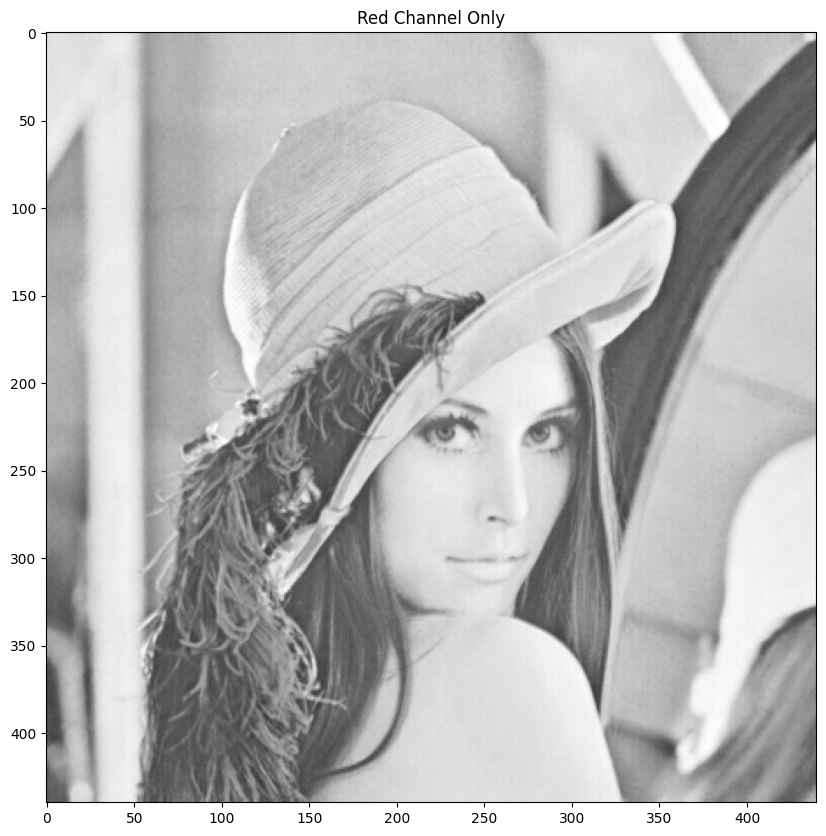

In [3]:
# Each color space on it's on will look like a grayscale as it lacks the other color channels
imshow("Blue Channel Only", B)
imshow("Green Channel Only", G)
imshow("Red Channel Only", R)

In [4]:
R.dtype

dtype('uint8')

In [5]:
import numpy as np

# Let's create a matrix of zeros
# with dimensions of the image h x w
zeros = np.zeros(image.shape[:2])
print(zeros.dtype)

imshow("Red", cv2.merge([zeros, zeros, R]))
imshow("Green", cv2.merge([zeros, G, zeros]))
imshow("Blue", cv2.merge([B, zeros, zeros]))

float64


error: OpenCV(4.8.0) /io/opencv/modules/core/src/merge.dispatch.cpp:129: error: (-215:Assertion failed) mv[i].size == mv[0].size && mv[i].depth() == depth in function 'merge'


- To avoid the above error of size, we need to specify the type

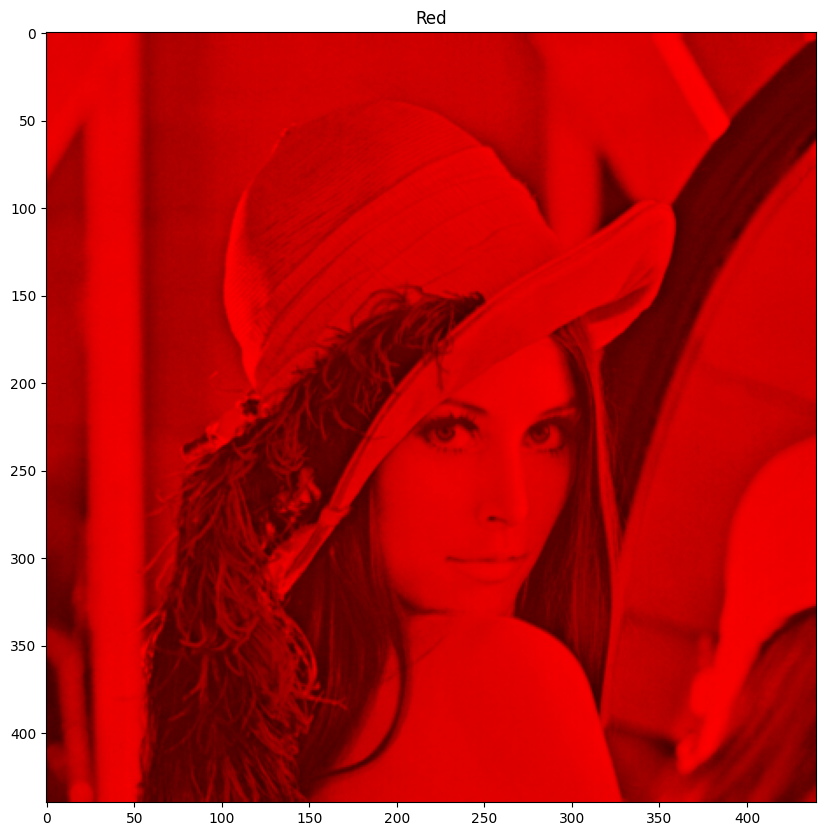

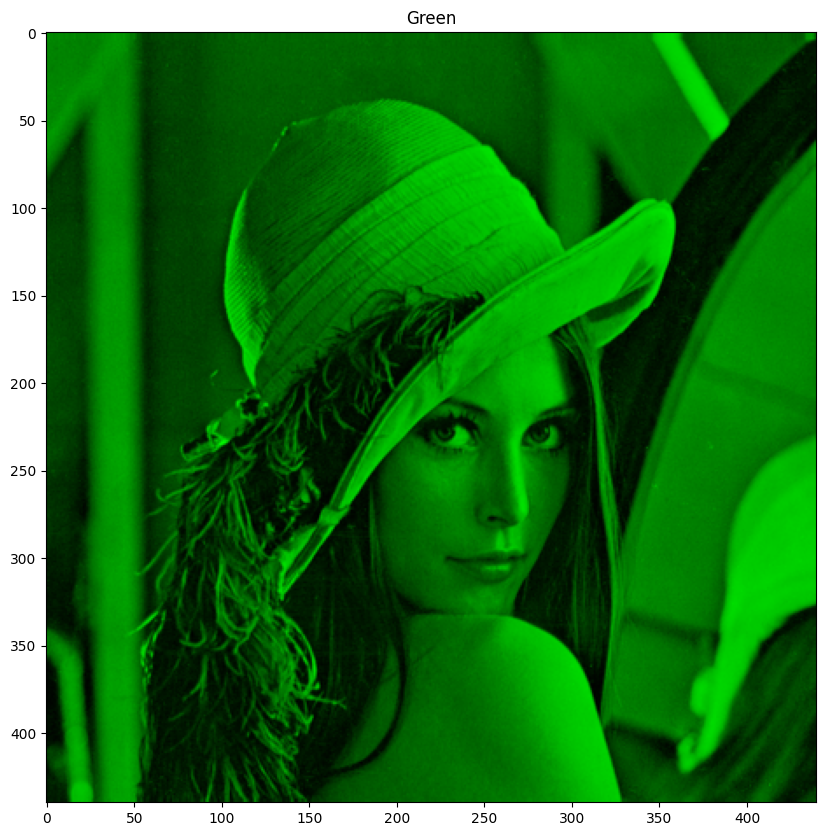

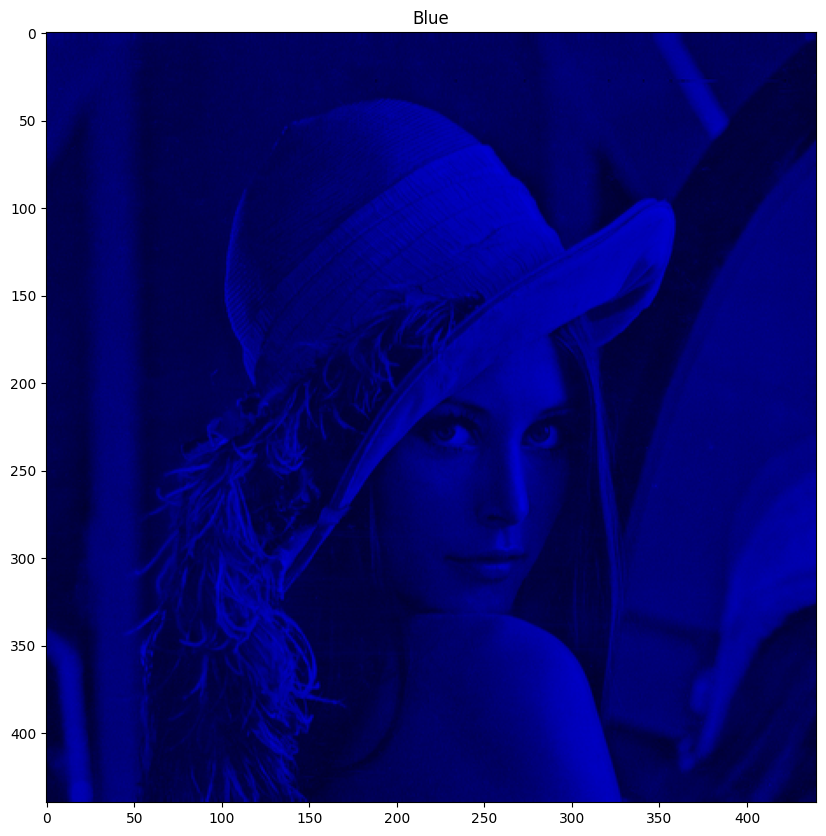

In [6]:
import numpy as np

# Let's create a matrix of zeros
# with dimensions of the image h x w
zeros = np.zeros(image.shape[:2],dtype='uint8')

imshow("Red", cv2.merge([zeros, zeros, R]))
imshow("Green", cv2.merge([zeros, G, zeros]))
imshow("Blue", cv2.merge([B, zeros, zeros]))

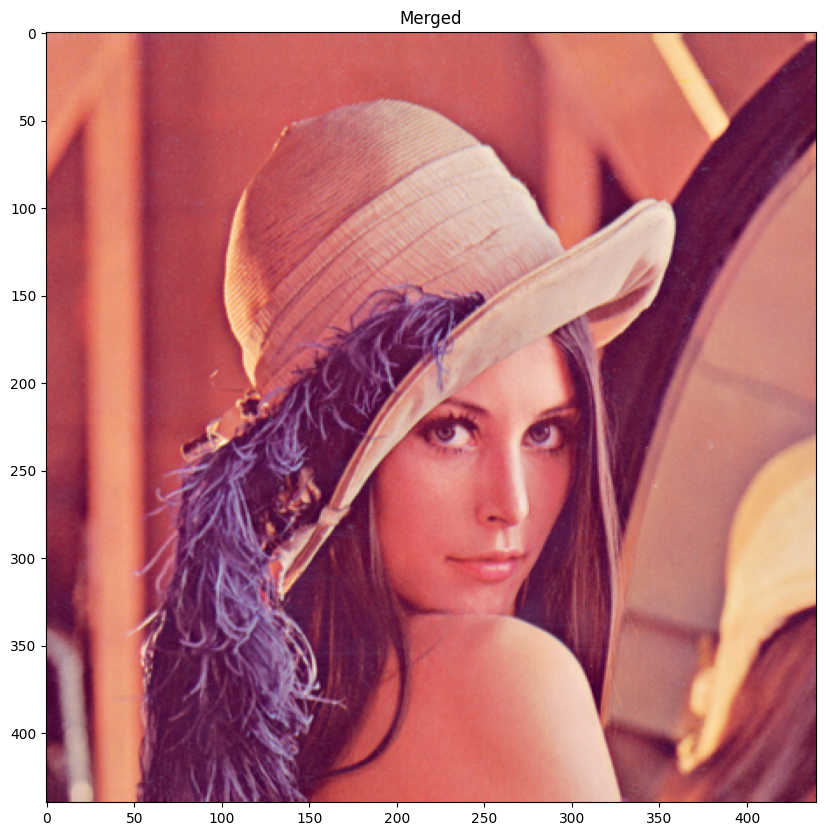

In [7]:
image = cv2.imread('/content/lena.png')

# OpenCV's 'split' function splites the image into each color index
B, G, R = cv2.split(image)

# Let's re-make the original image,
merged = cv2.merge([B, G, R])
imshow("Merged", merged)

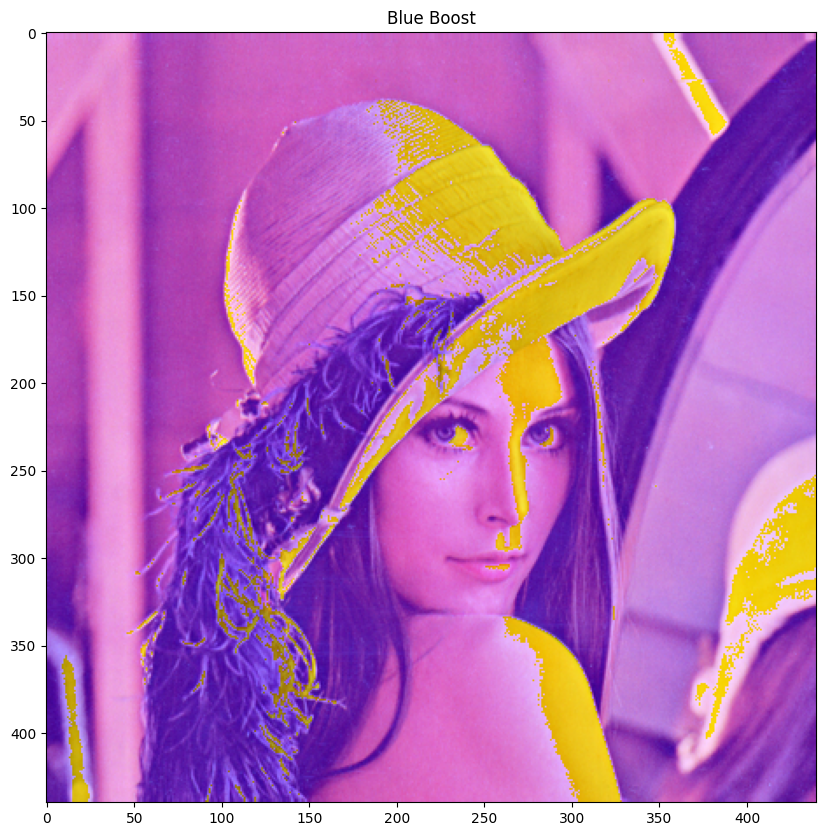

In [8]:
# Let's amplify the blue color
merged = cv2.merge([B+100, G, R])
imshow("Blue Boost", merged)

## **The HSV Color Space**

![](https://upload.wikimedia.org/wikipedia/commons/f/f2/HSV_color_solid_cone.png)

- Hue: 0 - 179
- Saturation: 0 - 255 ( white to color)
- Value (Intensity): 0 - 255

- **Hue**:

Refers to the three primary colors (red, blue, and yellow), and the three secondary colors (orange, green, and violet) that appear in the color wheel.

- **Saturation**:

Refers to the purity and intensity of a color. The higher the saturation of a color, the more vivid and intense it is.

- **Value**:

Also known as brightness, value describes the brightness or intensity of the color, from 0 to 100 percent, where 0 is completely black, and 100 is the brightest and reveals the most color.

- Whenever we want to solve problems related to object detection, it is necessary to use HSV and find the range of HSV.

- The Hue, Saturation, and Value in HSV have their own range of values.
- The Hue range in HSV is [0,179], the Saturation range in HSV is [0,255] and the Value range in HSV is [0,255].
- There is also an upper bound and lower bound range for a range of each color in HSV.
- The HSV or Hue, Saturation, and value of a given object provide better performance when compared to RGB or Red, Blue, and Green color space and hence it is used widely in the area of computer vision.

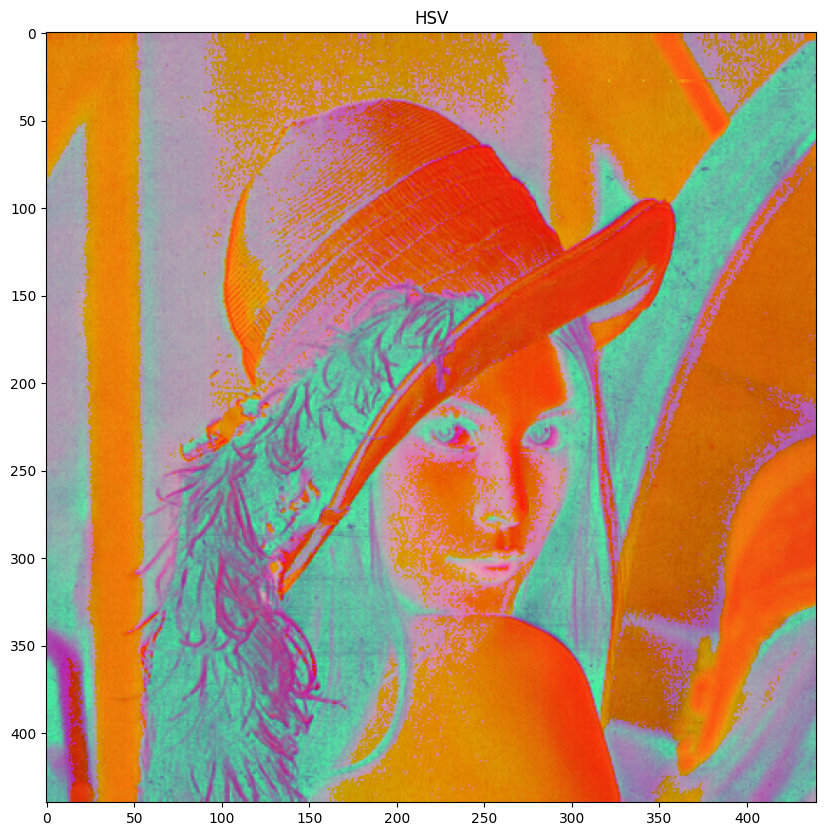

In [9]:
# Reload our image
image = cv2.imread('/content/lena.png')

# Convert to HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
imshow('HSV', hsv_image)

#### This looks odd....why?

Because our plotting function was designed for RGB only images, not HSV

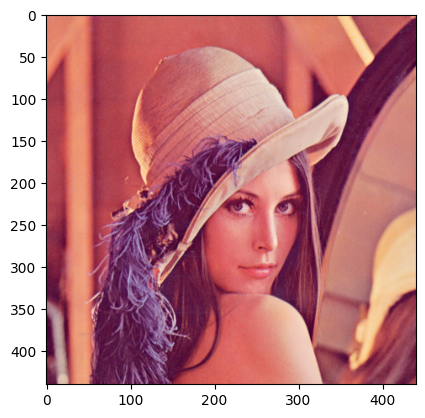

In [10]:
plt.imshow(cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB))
plt.show()

### **Let's view each channel type in the HSV Color Space representation**

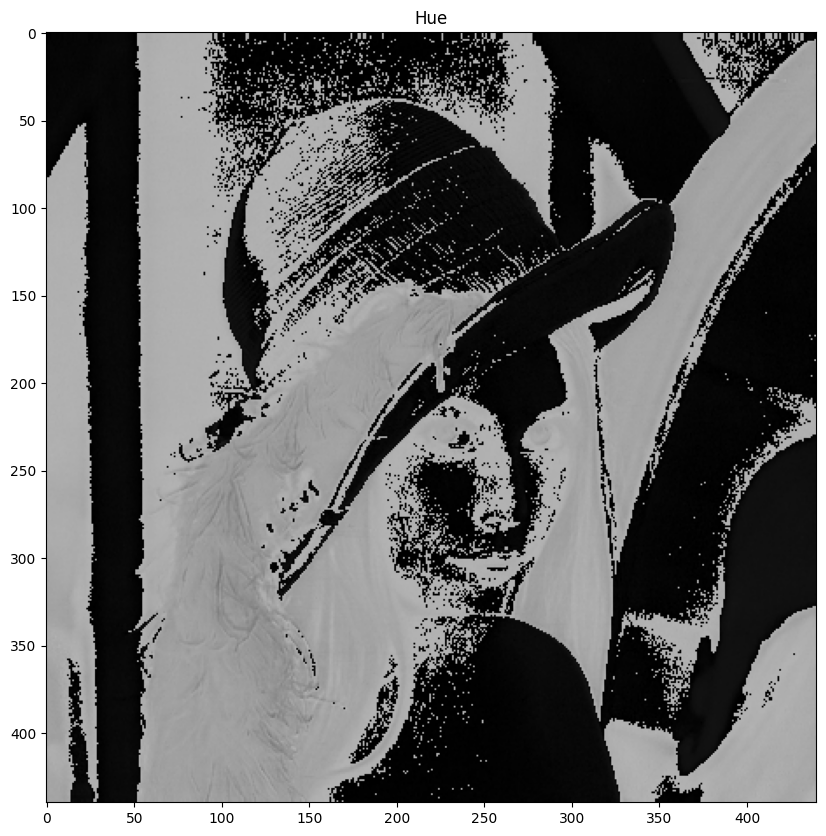

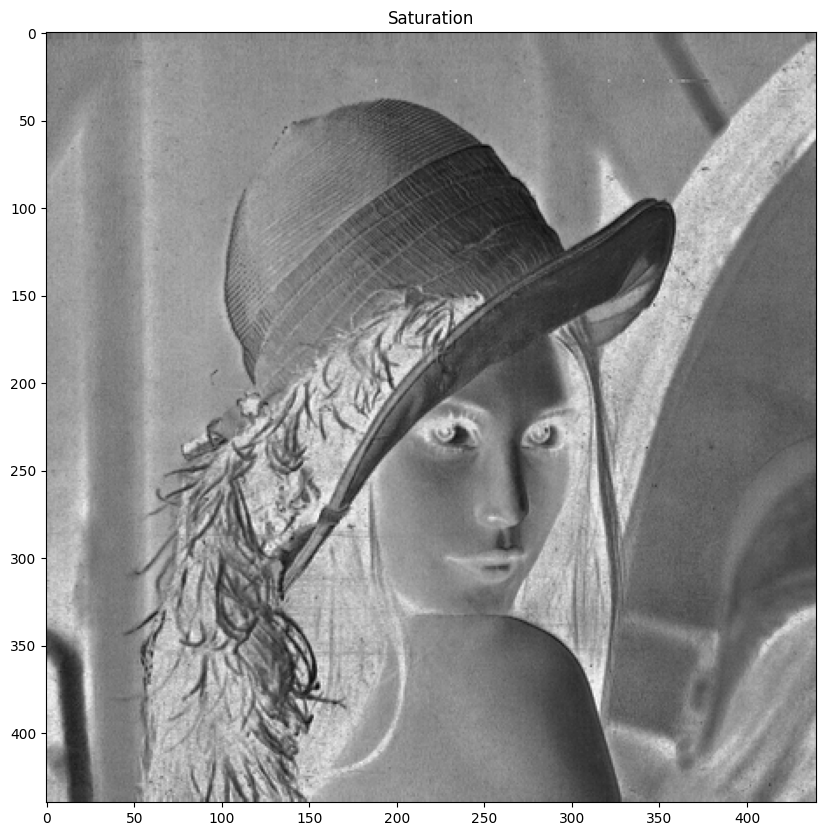

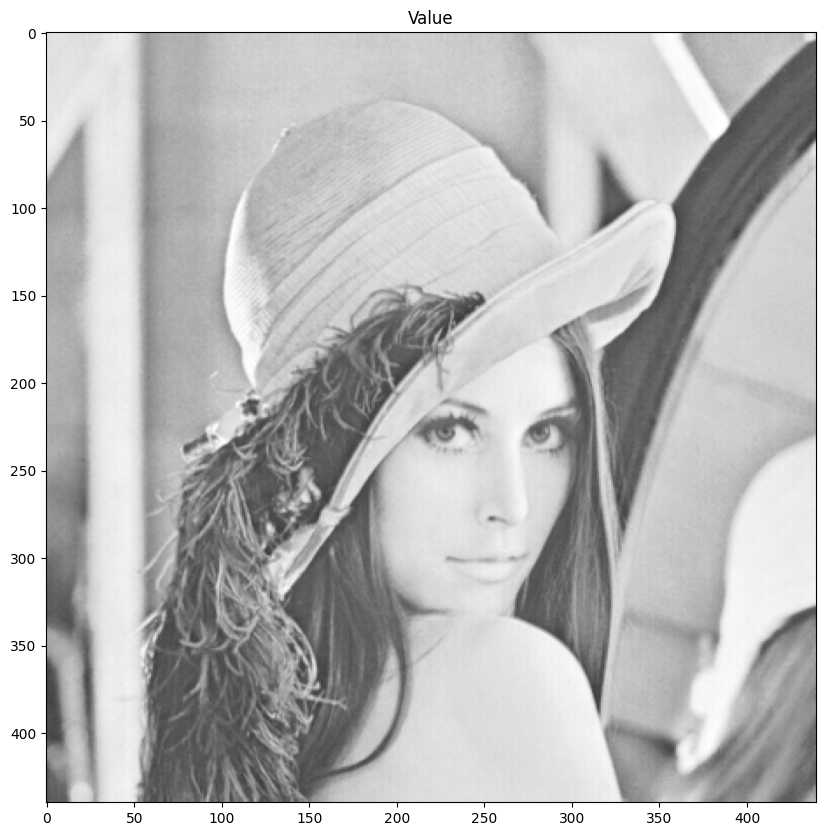

In [11]:
# Switching back to viewing the RGB representation
imshow("Hue", hsv_image[:, :, 0])
imshow("Saturation", hsv_image[:, :, 1])
imshow("Value", hsv_image[:, :, 2])

## Image segmentation using Color Space
- OpenCV program in python to mask the black color in the given image by converting it into an HSV image and specifying the lower threshold and upper threshold for a range of black color and then displaying the resulting image as the output on the screen

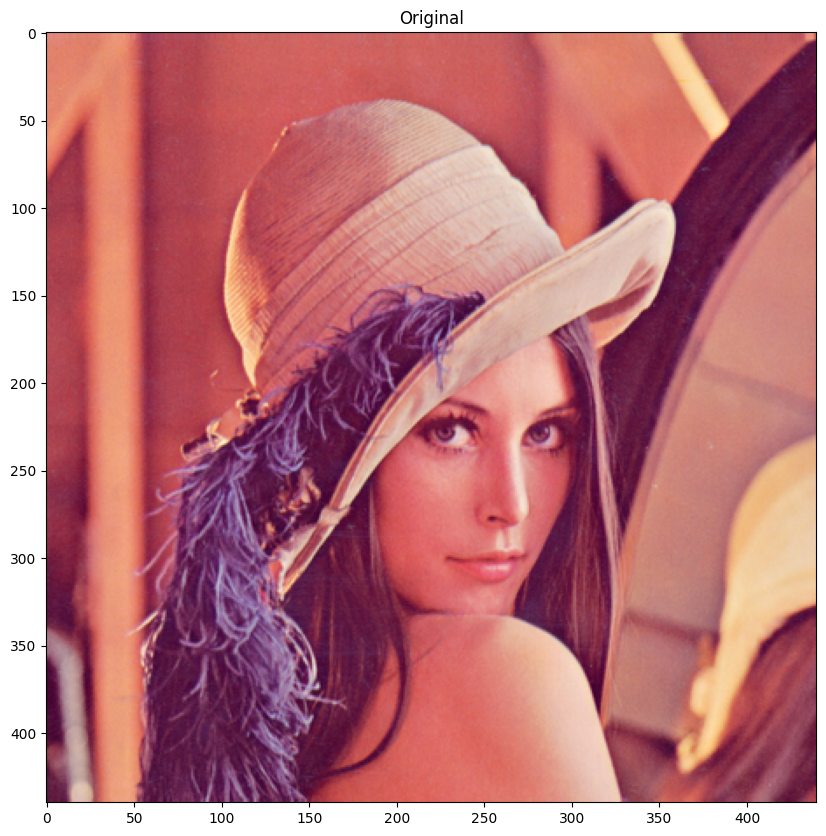

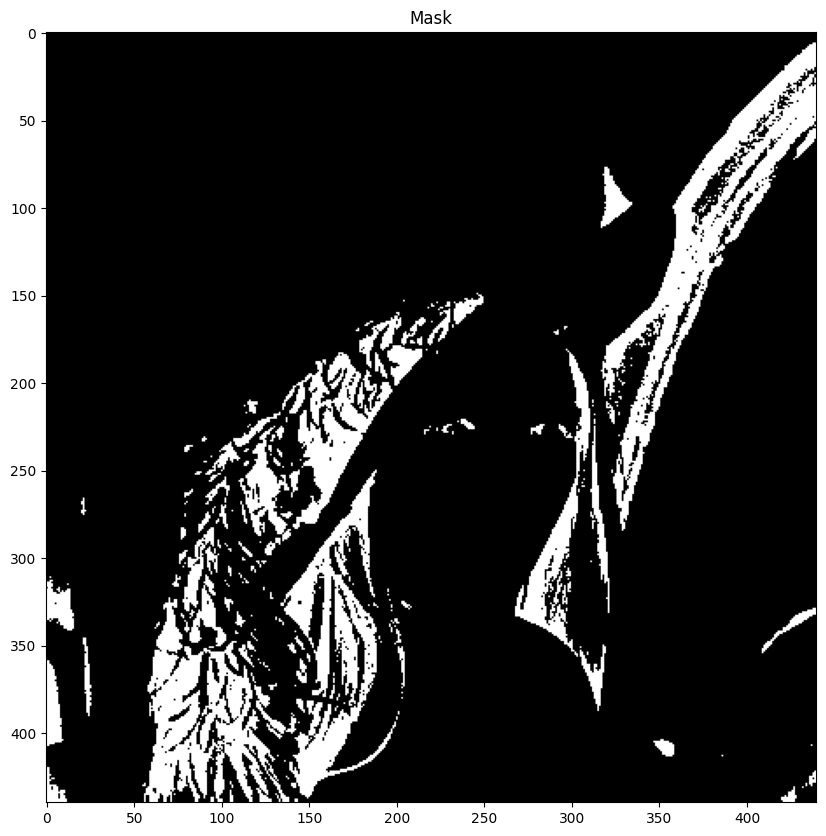

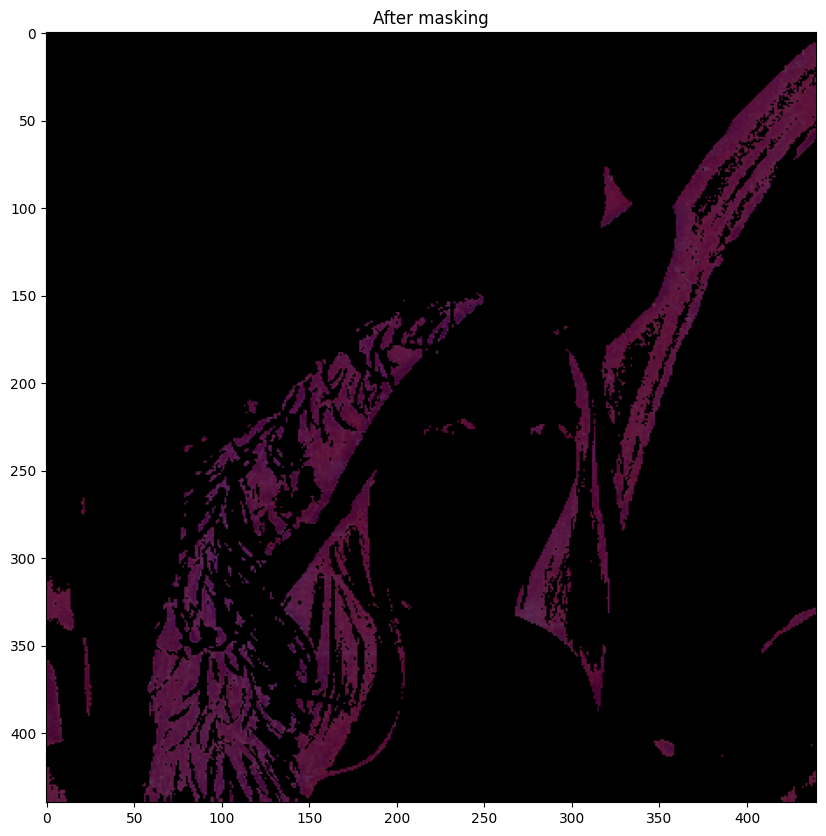

In [28]:
#reading the image which is to be converted to HSV color space
image = cv2.imread('/content/lena.png')
#converting the image to HSV color space using cvtColor function
imagehsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
#defining the lower threshold and upper threshold for a range of black color in HSV
lower_black = np.array([0, 0, 0])
upper_black = np.array([179,255,100])
#masking the HSV image to get only black colors
mask = cv2.inRange(imagehsv, lower_black, upper_black)

target = cv2.bitwise_and(image,image, mask=mask)

#displaying the resulting HSV image with only black colors masked
# cv2.imwrite("/content/blackmasked.png", mask)

imshow('Original',image)
imshow('Mask', mask)
imshow('After masking', target)


## Automate Bounding Values of HSV
- Here's a simple HSV color thresholder script to determine the lower/upper color ranges using trackbars for any image on the disk. Simply change the image path in cv2.imread(). Example to isolate orange:

- Its not running here , you can check its working in HSV_range.py file.

In [ ]:
import cv2
import numpy as np
def nothing(x):
    pass

# Load image
image = cv2.imread('./images/castara.jpeg')

# Create a window
cv2.namedWindow('image')

# Create trackbars for color change
# Hue is from 0-179 for Opencv
cv2.createTrackbar('HMin', 'image', 0, 179, nothing)
cv2.createTrackbar('SMin', 'image', 0, 255, nothing)
cv2.createTrackbar('VMin', 'image', 0, 255, nothing)
cv2.createTrackbar('HMax', 'image', 0, 179, nothing)
cv2.createTrackbar('SMax', 'image', 0, 255, nothing)
cv2.createTrackbar('VMax', 'image', 0, 255, nothing)

# Set default value for Max HSV trackbars
cv2.setTrackbarPos('HMax', 'image', 179)
cv2.setTrackbarPos('SMax', 'image', 255)
cv2.setTrackbarPos('VMax', 'image', 255)

# Initialize HSV min/max values
hMin = sMin = vMin = hMax = sMax = vMax = 0
phMin = psMin = pvMin = phMax = psMax = pvMax = 0

while(1):
    # Get current positions of all trackbars
    hMin = cv2.getTrackbarPos('HMin', 'image')
    sMin = cv2.getTrackbarPos('SMin', 'image')
    vMin = cv2.getTrackbarPos('VMin', 'image')
    hMax = cv2.getTrackbarPos('HMax', 'image')
    sMax = cv2.getTrackbarPos('SMax', 'image')
    vMax = cv2.getTrackbarPos('VMax', 'image')

    # Set minimum and maximum HSV values to display
    lower = np.array([hMin, sMin, vMin])
    upper = np.array([hMax, sMax, vMax])

    # Convert to HSV format and color threshold
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv, lower, upper)
    result = cv2.bitwise_and(image, image, mask=mask)

    # Print if there is a change in HSV value
    if((phMin != hMin) | (psMin != sMin) | (pvMin != vMin) | (phMax != hMax) | (psMax != sMax) | (pvMax != vMax) ):
        print("(hMin = %d , sMin = %d, vMin = %d), (hMax = %d , sMax = %d, vMax = %d)" % (hMin , sMin , vMin, hMax, sMax , vMax))
        phMin = hMin
        psMin = sMin
        pvMin = vMin
        phMax = hMax
        psMax = sMax
        pvMax = vMax

    # Display result image
    cv2.imshow('image', result)
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break

cv2.destroyAllWindows()

## Alternative Way using RGB Values
- To find the HSV value of Green, try following commands

In [29]:
import numpy as np
import cv2

green = np.uint8([[[0,255,0 ]]])
hsv_green = cv2.cvtColor(green,cv2.COLOR_BGR2HSV)
print(hsv_green)

[[[ 60 255 255]]]
